In [1]:
import pandas as pd
import requests
import numpy as np
import os
import math
from scipy.stats import beta, uniform, norm
from locfdr_python.locfdr_for_plot import locfdr
from statsmodels.stats.multitest import multipletests
from collections import OrderedDict
import subprocess
hugo = pd.read_csv('/Users/leyang/Dropbox/Projects/Subnetwork_survey/code/Database/hugo_symbol.txt')
hugo = list(hugo['Approved symbol'])

In [2]:
#pathway name to id
reactome_id_mapping = pd.read_csv('../ReactomePathways/NCBI2Reactome.txt',sep='\t',header=None)
reactome_id_mapping_human = reactome_id_mapping.loc[reactome_id_mapping[5] == 'Homo sapiens']
pathway_mapping = zip(list(reactome_id_mapping_human[1]),list(reactome_id_mapping_human[3]))
pathway_dict = dict()
for k,v in pathway_mapping:
    if k not in pathway_dict.keys():
        pathway_dict[k] = v
    if k in pathway_dict.keys():
        if pathway_dict[k] != v:
            print('error!')
inv_map = {v: k for k, v in pathway_dict.items()}

/var/folders/k2/d_6zclqn7nd10x84q4mvx5l00000gn/T/ipykernel_21766/3216766961.py:2: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  reactome_id_mapping = pd.read_csv('../ReactomePathways/NCBI2Reactome.txt',sep='\t',header=None)


In [3]:
reactome_raw = pd.read_csv('/Users/leyang/Dropbox/Projects/Subnetwork_survey/code/Database/human_pathway_lowlevel_ncbi.txt',sep='\t')
pathway_name = list(set(reactome_raw['pathway_name']))
reactome_standarize = []
for p in pathway_name:
    pp = reactome_raw[reactome_raw['pathway_name'] == p]
    gene_raw = list(pp['Gene'])
    gene_list = [gene_raw[i] for i in range(len(gene_raw)) if gene_raw[i] in hugo]
    evidence_raw = list(pp['evidence'])
    evidence_list = [evidence_raw[i] for i in range(len(gene_raw)) if gene_raw[i] in hugo]
    # query the cancer relation
    path_id = inv_map[p]
    url = f'https://reactome.org/ContentService/data/query/{path_id}'
    response = requests.get(url)
    data = response.json()
    cancer = 0
    if 'disease' in data:
        disease_info = data['disease']
        disease_name = [x.get('displayName', '').lower() for x in disease_info]
        if 'cancer' in disease_name:
            cancer = 1
        else:
            cancer = 0
    else:
        cancer = 0
        
    reactome_standarize.append((p,len(gene_list),gene_list,cancer,evidence_list))

reactome_standarize = [x for x in reactome_standarize if x[1] >= 10]

In [4]:
reactome_cancer = [x for x in reactome_standarize if x[3]==1]
remove_index = []
for i in range(len(reactome_cancer)):
    for j in range(len(reactome_cancer)):
        if i != j:
            intersect_length = len([val for val in reactome_cancer[i][2] if val in reactome_cancer[j][2]])
            if intersect_length / len(reactome_cancer[i][4]) > 0.8:
                remove_index.append(i)
                
reactome_cancer_final = [reactome_cancer[i] for i in range(len(reactome_cancer)) if i not in set(remove_index)]

In [5]:
reactome_cancer_final = [(x[0],x[1],x[2],x[4]) for x in reactome_cancer_final]
reactome_cancer_final_save = [(name,s,','.join(gene_list),','.join(evidence_list)) for (name,s,gene_list,evidence_list) in reactome_cancer_final]
df_reactome = pd.DataFrame(reactome_cancer_final_save,columns=['Name','Size','Genes','Evidence'])
df_reactome.to_csv('./Database/reactome_cancer.txt',sep='\t')

In [7]:
## pre-preocessing the complexes
corum_cancer_raw = pd.read_csv('/Users/leyang/Dropbox/Projects/Subnetwork_survey/code/Database/cancerComplexes.txt',delimiter='\t')
corum_human = corum_cancer_raw[corum_cancer_raw['organism'] == 'Human']
complex_ID = list(corum_human['complex_id'])
complex_name = list(corum_human['complex_name'])
complex_sub_gene_name = list(corum_human['subunits_gene_name'])
complex_sub_gene_name_split = [x.split(';') for x in complex_sub_gene_name]
complex_sub_size = [len(x) for x in complex_sub_gene_name_split]
large_index = [k for k in range(len(complex_sub_size)) if complex_sub_size[k] >= 10]

complex_ID_large = [complex_ID[x] for x in large_index]
complex_name_large = [complex_name[x] for x in large_index]
complex_sub_gene_name_split_large = [complex_sub_gene_name_split[x] for x in large_index]
complex_sub_size_large = [complex_sub_size[x] for x in large_index]

corum_tuple = zip(complex_ID_large, complex_name_large,complex_sub_size_large, complex_sub_gene_name_split_large)

## standarize gene names according to hugo symbol and entrez id
corum_standarize = []

for (i,name,s,gene_raw) in corum_tuple:
    gene_list = [gene_raw[i] for i in range(len(gene_raw)) if gene_raw[i] in hugo]
    corum_standarize.append((i,name,s,gene_list))

corum_standarize = [x for x in corum_standarize if 'None' not in x[3]]

remove_index = []
for i in range(len(corum_standarize)):
    for j in range(len(corum_standarize)):
        if i != j:
            intersect_length = len([val for val in corum_standarize[i][3] if val in corum_standarize[j][3]])
            if intersect_length / len(corum_standarize[i][3]) > 0.8:
                remove_index.append(i)

corum_cancer_final = [corum_standarize[i] for i in range(len(corum_standarize)) if i not in remove_index]
corum_cancer_final_save = [(i,name,s,','.join(gene_list)) for (i,name,s,gene_list) in corum_cancer_final]
df_corum = pd.DataFrame(corum_cancer_final_save,columns=['ID','Name','Size','Genes'])
df_corum.to_csv('./Database/corum_cancer.txt',sep='\t')

/Users/leyang/Dropbox/Projects/Subnetwork_survey/code/locfdr_python/locfdr_for_plot.py:165: UserWarning: f(z) misfit = 2.1. Rerun with larger df.
  wa.warn("f(z) misfit = " + str(round(D,1)) + ". Rerun with larger df.")
/Users/leyang/Dropbox/Projects/Subnetwork_survey/code/locfdr_python/locfdr_for_plot.py:172: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the do

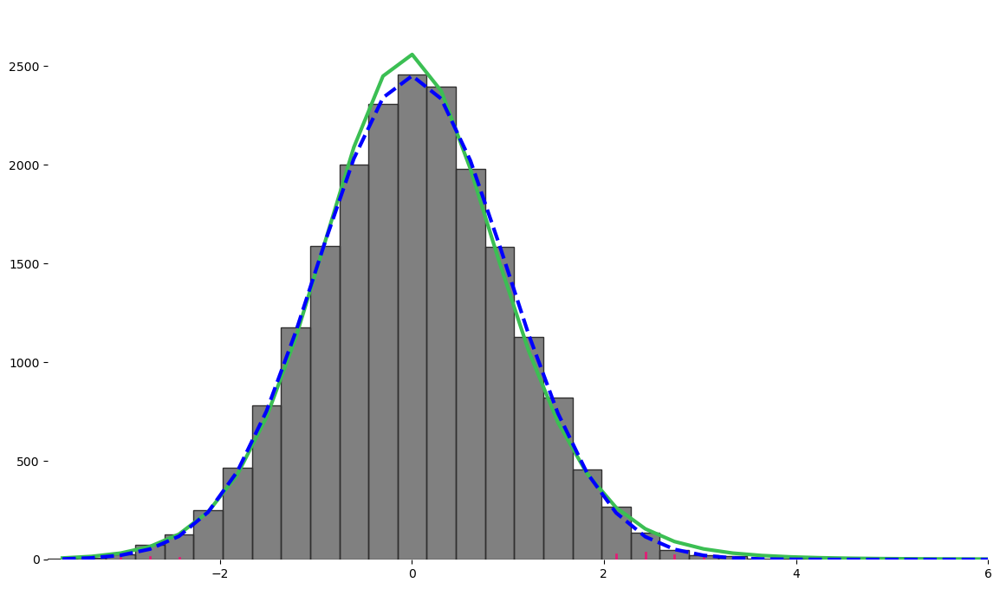

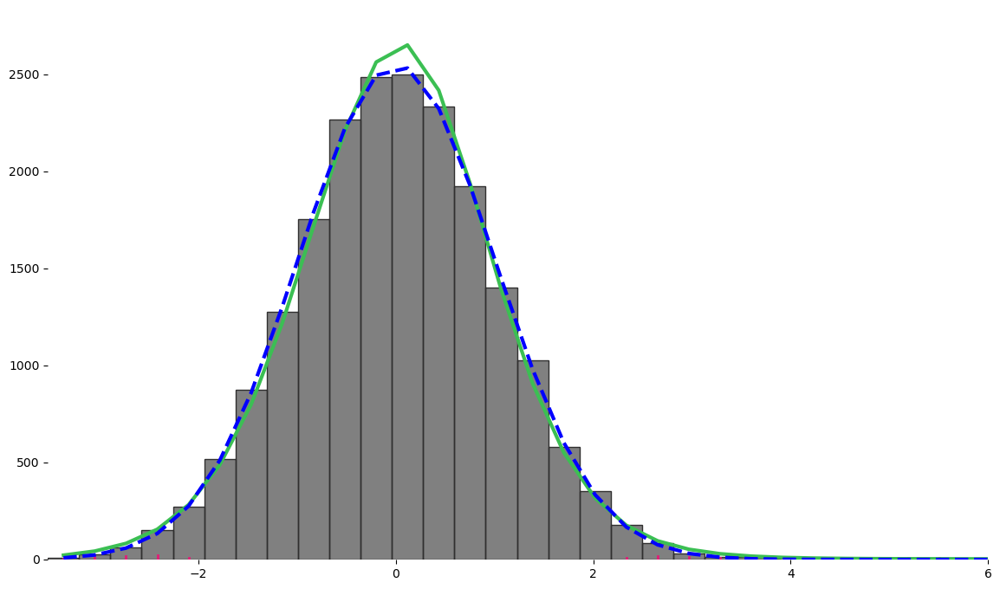

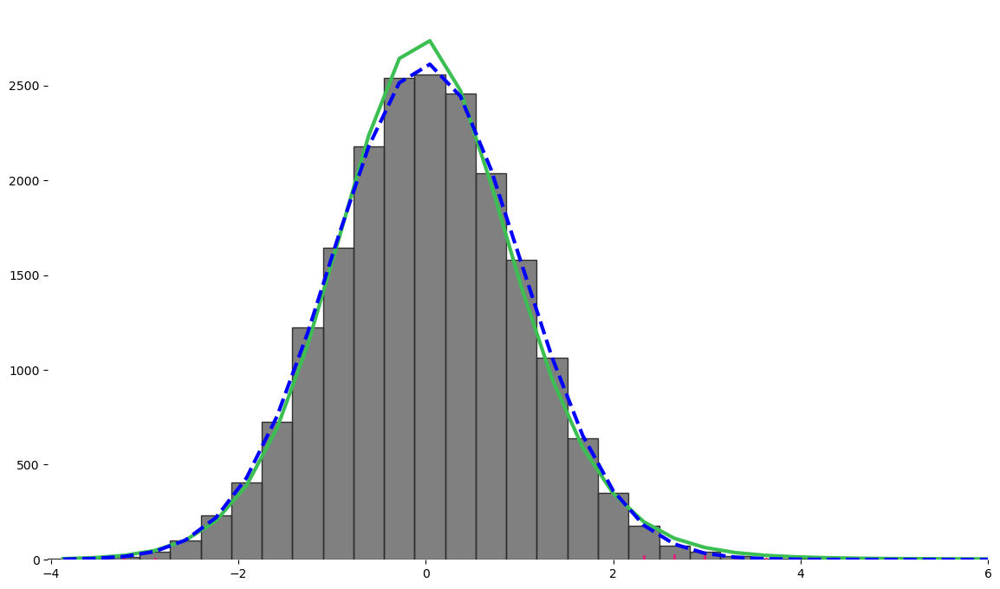

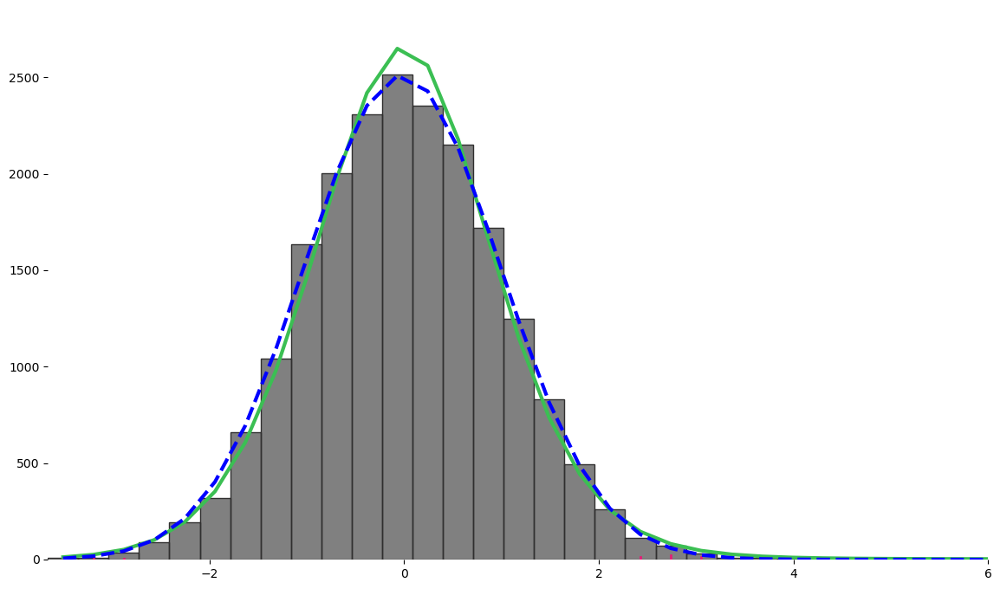

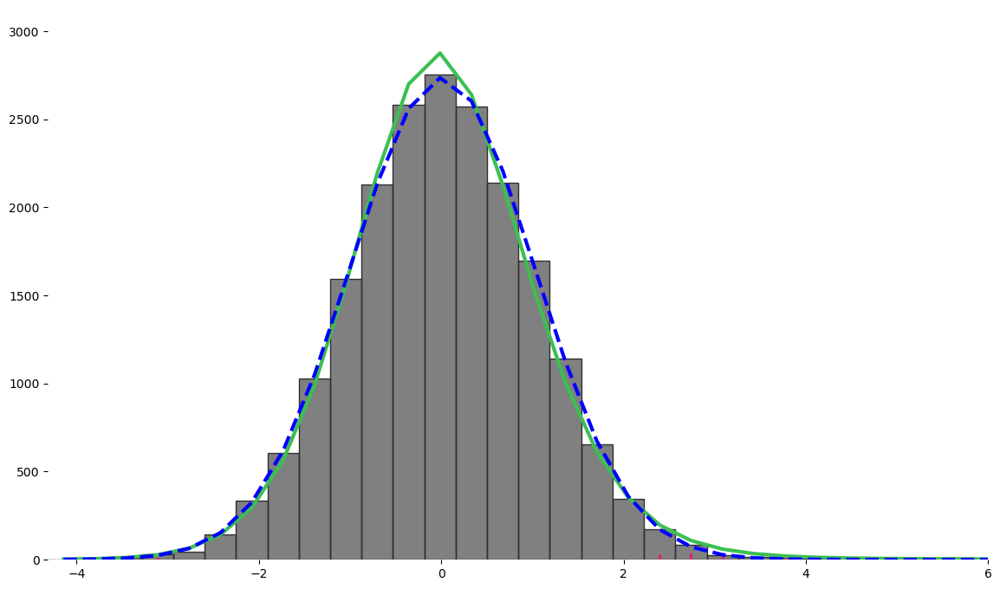

...

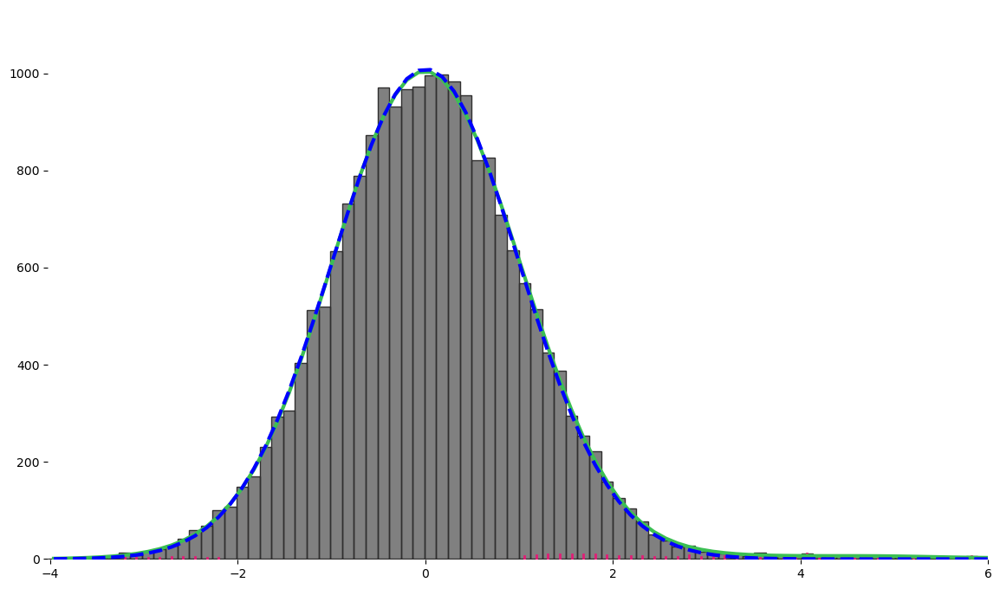

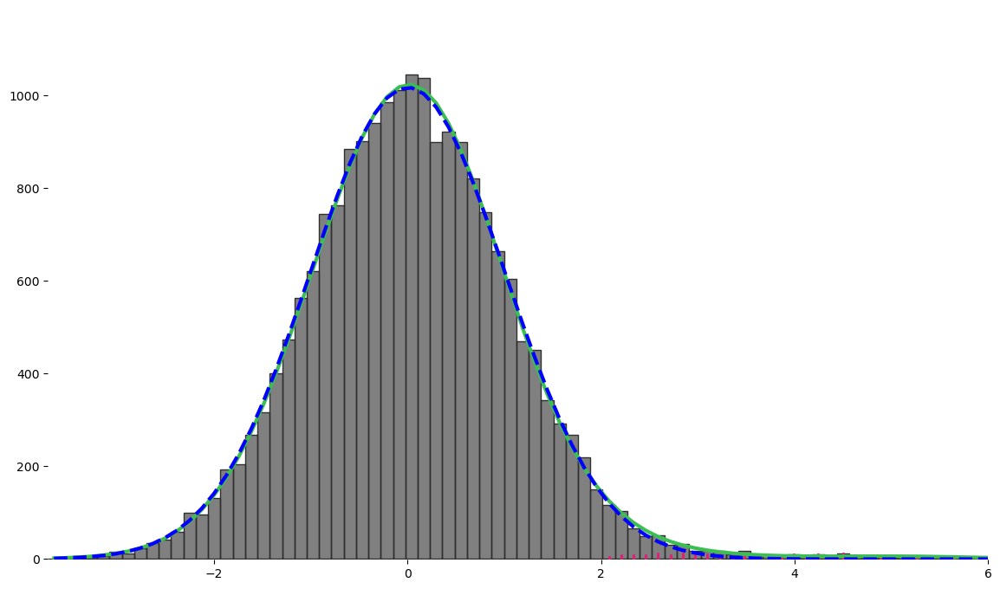

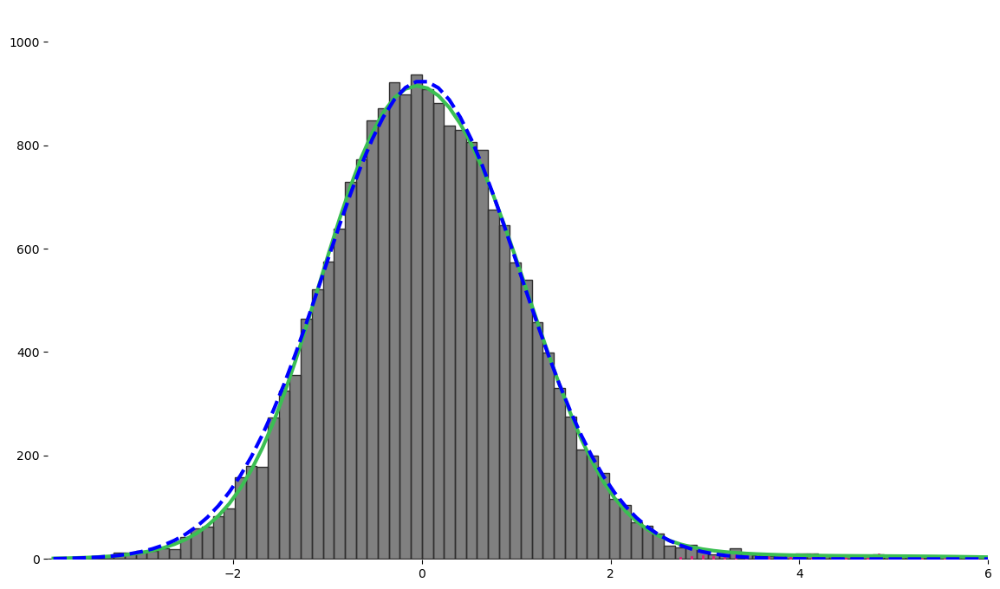

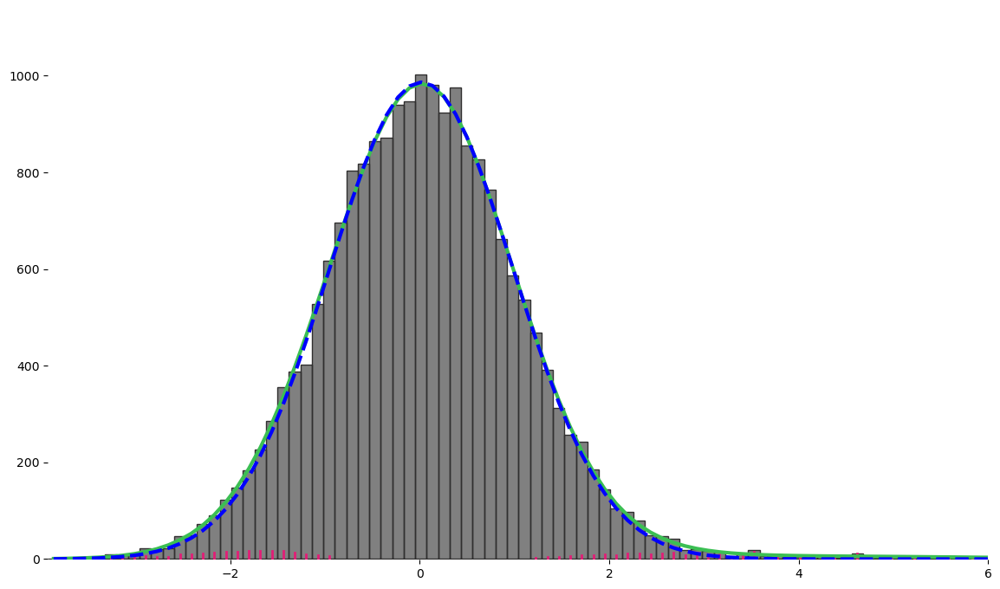

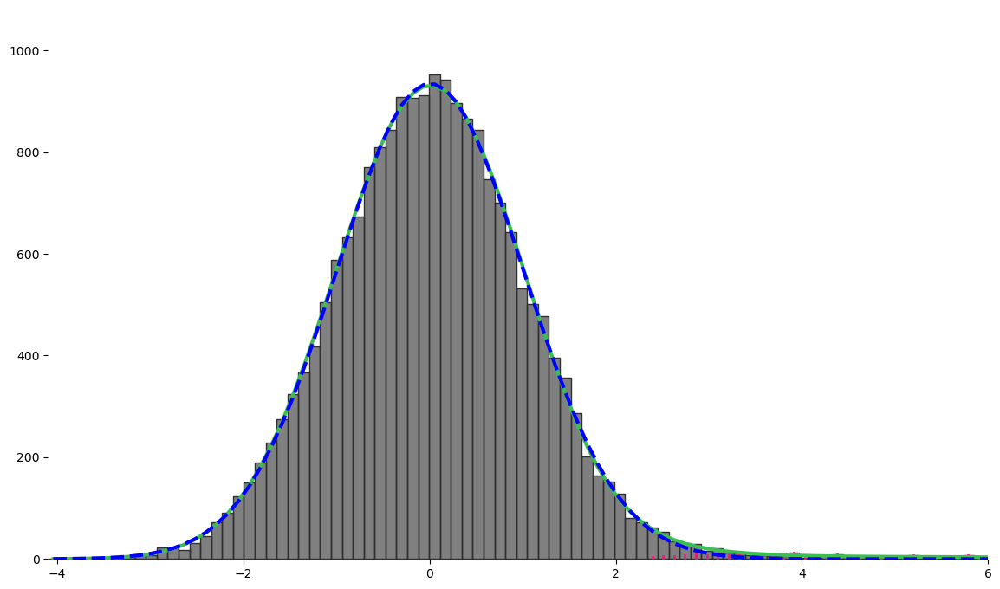

In [9]:
## Part 3: generate p-values
## (a) p-values for CORUM
## (a).1 sampling target subnetworks
## (a).2 sampling p-values 110 times, a = 0.01 to 0.11, 
## (a).3 transform p-values to q-score, locfdr, gene list, etc
## (a).4 save all data
## (a).5 send all data to CCR
np.random.seed(seed=42)
#load genes
tmp = pd.read_csv('./networks/merge_bioirefreastr_index_gene',sep='\t',header=None)
total_gene = list(tmp[1])
tmp_bio = pd.read_csv('./networks/biogrid_index_gene',sep='\t',header=None)
bio_gene = list(tmp_bio[1])
tmp_iref = pd.read_csv('./networks/irefindex18_index_gene',sep='\t',header=None)
iref_gene = list(tmp_iref[1])
tmp_rea = pd.read_csv('./networks/reactome21_index_gene',sep='\t',header=None)
rea_gene = list(tmp_rea[1])
tmp_str = pd.read_csv('./networks/string_index_gene',sep='\t',header=None)
str_gene = list(tmp_str[1])

# CORUM
base_path = '/Users/leyang/Dropbox/Projects/Subnetwork_survey'
for i in ["cancer"]:
    name = "corum_" + str(i)
    path = os.path.join(base_path,'code','score',name)
    path_p = os.path.join(base_path,'code','score',name,'p')
    path_q = os.path.join(base_path,'code','score',name,'q')
    path_z = os.path.join(base_path,'code','score',name,'z')
    path_lfdr = os.path.join(base_path,'code','score',name,'lfdr')
    path_list = os.path.join(base_path,'code','score',name,'list')
    path_clustex = os.path.join(base_path,'code','score',name,'clustex')
    path_diamond = os.path.join(base_path,'code','score',name,'diamond')
    path_all = [path_p,path_q,path_z,path_lfdr,path_list,path_clustex,path_diamond]
    if not os.path.exists(path):
        os.makedirs(path)
    for pa in path_all:
        if not os.path.exists(pa):
            os.makedirs(pa)
    
    corum_target = [corum_cancer_final[x][3] for x in range(len(corum_cancer_final))]
    corum_target_save = [corum_cancer_final_save[x] for x in range(len(corum_cancer_final_save))]
    tmp_df = pd.DataFrame(corum_target_save,columns=['ID','Name','Size','Genes'])
    tmp_df.to_csv(os.path.join(path,name+'_targets.txt'),sep='\t',index=False) #save targets
    target_genes = set([x for l in corum_target for x in l])
    
    target = [x for x in target_genes if x in total_gene]
    non_target = [x for x in total_gene if x not in target]
    a_list = [0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1,0.11]
    for a in a_list:
        for permu in range(1,11):
            
            target_p = beta.rvs(a=a, b=1, size=len(target))
            p_dict = dict(zip(target,target_p))
            non_target_p = uniform.rvs(size=len(non_target))
            non_target_dict = dict(zip(non_target,non_target_p))
            p_dict.update(non_target_dict)
            
            # BH method to p_adjusted, then -log10 to qvalues
            p_vals = [p_dict[k] for k in p_dict.keys()]
            tmp,p_adjusted,tmp,tmp = multipletests(p_vals,method='fdr_bh')
            q_score = [-math.log10(p) if p!=0 else 200 for p in p_adjusted]
            q_dict = dict(zip(p_dict.keys(),q_score))
            
            # calculate z-values
            z_vals = [-norm.ppf(p) for p in p_vals]
            z_dict = dict(zip(p_dict.keys(),z_vals))
            
            # calculate lfdr
            
            index_noninfs = [i for i in range(len(z_vals)) if z_vals[i] != -float('Inf') and z_vals[i] != float('Inf')]
            results = locfdr([z_vals[i] for i in index_noninfs],bre=120,df=10,saveplot=True,saveroot='./locfdr_plot/'+name+'beta_'+str(a)+'_'+str(permu),showplot=False)
            fdr_noninfs = results['fdr']
            fdr_dict = dict(zip(index_noninfs,fdr_noninfs))
            fdr = [1.0 for i in range(len(z_vals))]
            for i in range(len(z_vals)):
                if i in index_noninfs:
                    fdr[i] = fdr_dict[i]
                elif z_vals[i] == float('Inf'):
                    fdr[i] = 0
            for i in range(len(fdr)):
                if z_vals[i] < 0:
                    fdr[i] = 1.0
                if (z_vals[i] > 0) and math.isnan(fdr[i]):
                    fdr[i] = 0.0
            lfdr_dict = dict(zip(p_dict.keys(),fdr))
            
            # gene list
            gene_list = [k for k,v in lfdr_dict.items() if v <= 0.1]
            gene_list_index_bio = [bio_gene.index(g) + 1 for g in gene_list if g in bio_gene]
            gene_list_index_iref = [iref_gene.index(g) + 1 for g in gene_list if g in iref_gene]
            gene_list_index_rea = [rea_gene.index(g) + 1 for g in gene_list if g in rea_gene]
            gene_list_index_str = [str_gene.index(g) + 1 for g in gene_list if g in str_gene]
            
            
            # save all scores to files
            p_df = pd.DataFrame(sorted(p_dict.items()),columns=['Gene','p'])
            p_df.to_csv(os.path.join(path_p,name+'_p_beta_'+str(a)+'_'+str(permu)+'.txt'),header=None,sep='\t',index=False)
            q_df = pd.DataFrame(sorted(q_dict.items()),columns=['Gene','q'])
            q_df.to_csv(os.path.join(path_q,name+'_q_beta_'+str(a)+'_'+str(permu)+'.txt'),header=None,sep='\t',index=False)
            z_df = pd.DataFrame(sorted(z_dict.items()),columns=['Gene','z'])
            z_df.to_csv(os.path.join(path_z,name+'_z_beta_'+str(a)+'_'+str(permu)+'.txt'),header=None,sep='\t',index=False)
            lfdr_df = pd.DataFrame(sorted(lfdr_dict.items()),columns=['Gene','lfdr'])
            lfdr_df.to_csv(os.path.join(path_lfdr,name+'_lfdr_beta_'+str(a)+'_'+str(permu)+'.txt'),header=None,sep='\t',index=False)
            
            # gene list
            with open(os.path.join(path_list,name+'_list_beta_'+str(a)+'_'+str(permu)+'.txt'),'w') as file:
                for g in gene_list:
                    file.write("%s\n" % g)
                    
            # clustex biogrid
            with open(os.path.join(path_clustex,name+'_clustex_biogrid_beta_'+str(a)+'_'+str(permu)+'.txt'),'w') as file:
                file.write("Gene\n")
                for g in gene_list_index_bio:
                    file.write("%s\n" % g)
            # clustex irefindex
            with open(os.path.join(path_clustex,name+'_clustex_irefindex18_beta_'+str(a)+'_'+str(permu)+'.txt'),'w') as file:
                file.write("Gene\n")
                for g in gene_list_index_iref:
                    file.write("%s\n" % g)
            # clustex reactome21
            with open(os.path.join(path_clustex,name+'_clustex_reactome21_beta_'+str(a)+'_'+str(permu)+'.txt'),'w') as file:
                file.write("Gene\n")
                for g in gene_list_index_rea:
                    file.write("%s\n" % g)
            # clustex string
            with open(os.path.join(path_clustex,name+'_clustex_string_beta_'+str(a)+'_'+str(permu)+'.txt'),'w') as file:
                file.write("Gene\n")
                for g in gene_list_index_str:
                    file.write("%s\n" % g)
                    
            # diamond biogrid
            with open(os.path.join(path_diamond,name+'_diamond_biogrid_beta_'+str(a)+'_'+str(permu)+'.txt'),'w') as file:
                for g in gene_list_index_bio:
                    file.write("%s\n" % g)
            # diamond irefindex
            with open(os.path.join(path_diamond,name+'_diamond_irefindex18_beta_'+str(a)+'_'+str(permu)+'.txt'),'w') as file:
                for g in gene_list_index_iref:
                    file.write("%s\n" % g)
            # diamond reactome21
            with open(os.path.join(path_diamond,name+'_diamond_reactome21_beta_'+str(a)+'_'+str(permu)+'.txt'),'w') as file:
                for g in gene_list_index_rea:
                    file.write("%s\n" % g)
            # diamond string
            with open(os.path.join(path_diamond,name+'_diamond_string_beta_'+str(a)+'_'+str(permu)+'.txt'),'w') as file:
                for g in gene_list_index_str:
                    file.write("%s\n" % g)
                    
## Reactome
for i in ["cancer"]:
    name = "reactome_" + str(i)
    path = os.path.join(base_path,'code','score',name)
    path_p = os.path.join(base_path,'code','score',name,'p')
    path_q = os.path.join(base_path,'code','score',name,'q')
    path_z = os.path.join(base_path,'code','score',name,'z')
    path_lfdr = os.path.join(base_path,'code','score',name,'lfdr')
    path_list = os.path.join(base_path,'code','score',name,'list')
    path_clustex = os.path.join(base_path,'code','score',name,'clustex')
    path_diamond = os.path.join(base_path,'code','score',name,'diamond')
    path_all = [path_p,path_q,path_z,path_lfdr,path_list,path_clustex,path_diamond]
    if not os.path.exists(path):
        os.makedirs(path)
    for pa in path_all:
        if not os.path.exists(pa):
            os.makedirs(pa)
    reactome_target = [reactome_cancer_final[x][2] for x in range(len(reactome_cancer_final))]
    reactome_target_save = [reactome_cancer_final_save[x] for x in range(len(reactome_cancer_final_save)) if x in index]
    tmp_df = pd.DataFrame(reactome_target_save,columns=['ID','Name','Size','Genes'])
    tmp_df.to_csv(os.path.join(path,name+'_targets.txt'),sep='\t',index=False) #save targets
    target_genes = set([x for l in reactome_target for x in l])
    
    target = [x for x in target_genes if x in total_gene]
    non_target = [x for x in total_gene if x not in target]
    a_list = [0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1,0.11]
    for a in a_list:
        for permu in range(1,11):
            
            target_p = beta.rvs(a=a, b=1, size=len(target))
            p_dict = dict(zip(target,target_p))
            non_target_p = uniform.rvs(size=len(non_target))
            non_target_dict = dict(zip(non_target,non_target_p))
            p_dict.update(non_target_dict)
            
            # BH method to p_adjusted, then -log10 to qvalues
            p_vals = [p_dict[k] for k in p_dict.keys()]
            tmp,p_adjusted,tmp,tmp = multipletests(p_vals,method='fdr_bh')
            q_score = [-math.log10(p) if p!=0 else 200 for p in p_adjusted]
            q_dict = dict(zip(p_dict.keys(),q_score))
            
            # calculate z-values
            z_vals = [-norm.ppf(p) for p in p_vals]
            z_dict = dict(zip(p_dict.keys(),z_vals))
            
            # calculate lfdr
            
            index_noninfs = [i for i in range(len(z_vals)) if z_vals[i] != -float('Inf') and z_vals[i] != float('Inf')]
            results = locfdr([z_vals[i] for i in index_noninfs],bre=120,df=10,saveplot=True,saveroot='./locfdr_plot/'+name+'beta_'+str(a)+'_'+str(permu),showplot=False)
            fdr_noninfs = results['fdr']
            fdr_dict = dict(zip(index_noninfs,fdr_noninfs))
            fdr = [1.0 for i in range(len(z_vals))]
            for i in range(len(z_vals)):
                if i in index_noninfs:
                    fdr[i] = fdr_dict[i]
                elif z_vals[i] == float('Inf'):
                    fdr[i] = 0
            for i in range(len(fdr)):
                if z_vals[i] < 0:
                    fdr[i] = 1.0
                if (z_vals[i] > 0) and math.isnan(fdr[i]):
                    fdr[i] = 0.0
            lfdr_dict = dict(zip(p_dict.keys(),fdr))
            
            # gene list
            gene_list = [k for k,v in lfdr_dict.items() if v <= 0.1]
            gene_list_index_bio = [bio_gene.index(g) + 1 for g in gene_list if g in bio_gene]
            gene_list_index_iref = [iref_gene.index(g) + 1 for g in gene_list if g in iref_gene]
            gene_list_index_rea = [rea_gene.index(g) + 1 for g in gene_list if g in rea_gene]
            gene_list_index_str = [str_gene.index(g) + 1 for g in gene_list if g in str_gene]
            
            
            # save all scores to files
            p_df = pd.DataFrame(sorted(p_dict.items()),columns=['Gene','p'])
            p_df.to_csv(os.path.join(path_p,name+'_p_beta_'+str(a)+'_'+str(permu)+'.txt'),header=None,sep='\t',index=False)
            q_df = pd.DataFrame(sorted(q_dict.items()),columns=['Gene','q'])
            q_df.to_csv(os.path.join(path_q,name+'_q_beta_'+str(a)+'_'+str(permu)+'.txt'),header=None,sep='\t',index=False)
            z_df = pd.DataFrame(sorted(z_dict.items()),columns=['Gene','z'])
            z_df.to_csv(os.path.join(path_z,name+'_z_beta_'+str(a)+'_'+str(permu)+'.txt'),header=None,sep='\t',index=False)
            lfdr_df = pd.DataFrame(sorted(lfdr_dict.items()),columns=['Gene','lfdr'])
            lfdr_df.to_csv(os.path.join(path_lfdr,name+'_lfdr_beta_'+str(a)+'_'+str(permu)+'.txt'),header=None,sep='\t',index=False)
            
            # gene list
            with open(os.path.join(path_list,name+'_list_beta_'+str(a)+'_'+str(permu)+'.txt'),'w') as file:
                for g in gene_list:
                    file.write("%s\n" % g)
                    
            # clustex biogrid
            with open(os.path.join(path_clustex,name+'_clustex_biogrid_beta_'+str(a)+'_'+str(permu)+'.txt'),'w') as file:
                file.write("Gene\n")
                for g in gene_list_index_bio:
                    file.write("%s\n" % g)
            # clustex irefindex
            with open(os.path.join(path_clustex,name+'_clustex_irefindex18_beta_'+str(a)+'_'+str(permu)+'.txt'),'w') as file:
                file.write("Gene\n")
                for g in gene_list_index_iref:
                    file.write("%s\n" % g)
            # clustex reactome21
            with open(os.path.join(path_clustex,name+'_clustex_reactome21_beta_'+str(a)+'_'+str(permu)+'.txt'),'w') as file:
                file.write("Gene\n")
                for g in gene_list_index_rea:
                    file.write("%s\n" % g)
            # clustex string
            with open(os.path.join(path_clustex,name+'_clustex_string_beta_'+str(a)+'_'+str(permu)+'.txt'),'w') as file:
                file.write("Gene\n")
                for g in gene_list_index_str:
                    file.write("%s\n" % g)
                    
            # diamond biogrid
            with open(os.path.join(path_diamond,name+'_diamond_biogrid_beta_'+str(a)+'_'+str(permu)+'.txt'),'w') as file:
                for g in gene_list_index_bio:
                    file.write("%s\n" % g)
            # diamond irefindex
            with open(os.path.join(path_diamond,name+'_diamond_irefindex18_beta_'+str(a)+'_'+str(permu)+'.txt'),'w') as file:
                for g in gene_list_index_iref:
                    file.write("%s\n" % g)
            # diamond reactome21
            with open(os.path.join(path_diamond,name+'_diamond_reactome21_beta_'+str(a)+'_'+str(permu)+'.txt'),'w') as file:
                for g in gene_list_index_rea:
                    file.write("%s\n" % g)
            # diamond string
            with open(os.path.join(path_diamond,name+'_diamond_string_beta_'+str(a)+'_'+str(permu)+'.txt'),'w') as file:
                for g in gene_list_index_str:
                    file.write("%s\n" % g)
         
                    


In [53]:
corum_cancer_raw.columns

Index(['complex_id', 'complex_name', 'synonyms', 'organism', 'cell_line',
       'pmid', 'comment_complex', 'comment_members', 'comment_disease',
       'comment_drug', 'comment_drug_formal', 'subunits_uniprot_id',
       'subunits_gene_name', 'subunits_gene_name_synonyms',
       'subunits_protein_name', 'subunits_proteinname_synonyms',
       'subunits_organism', 'subunits_drugs', 'subunits_mims',
       'subunits_stoechiometrie', 'purification_methods', 'functions_evi',
       'functions_pmid', 'functions_go_id', 'functions_go_name',
       'functions_go_ontology', 'fcgs_description', 'fcgs_id', 'fcgs_name',
       'fcgs_category_id', 'fcgs_category_name', 'fcgs_go_id', 'fcgs_go_name',
       'fcgs_go_ontology'],
      dtype='object')